# Multimodal Models

In [ ]:
%pip install -qU openai
%pip install pypdfium2

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  poppler-utils
0 upgraded, 1 newly installed, 0 to remove and 30 not upgraded.
Need to get 186 kB of archives.
After this operation, 696 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 poppler-utils amd64 22.02.0-2ubuntu0.6 [186 kB]
Fetched 186 kB in 1s (311 kB/s)
Selecting previously unselected package poppler-utils.
(Reading database ... 126210 files and directories currently installed.)
Preparing to unpack .../poppler-utils_22.02.0-2ubuntu0.6_amd64.deb ...
Unpacking poppler-utils (22.02.0-2ubuntu0.6) ...
Setting up poppler-utils (22.02.0-2ubuntu0.6) ...
Processing triggers for man-db (2.10.2-1) ...


In [2]:
import base64
import io
import os
import textwrap
import time
import zipfile
from pathlib import Path

import openai
import pypdfium2 as pdfium
import requests
from dotenv import load_dotenv
from IPython.display import Audio, Image, Markdown, Math
from openai import AzureOpenAI
from PIL import Image as PILImage

In [3]:
# Load environment variables from .env file
load_dotenv()

llm_endpoint = "https://aa-dsa-training-msca.openai.azure.com/"
llm_model_name = "gpt-5-mini"
llm_deploy_name = "gpt-5-mini"

subscription_api_key = os.getenv("OPENAI_API_KEY")
api_version = "2024-12-01-preview"

client = AzureOpenAI(
    api_key=subscription_api_key,
    api_version=api_version,
    azure_endpoint=llm_endpoint,
)


If you are using Google Colab, uncomment it, to upload the file here:

In [4]:
# from google.colab import files
# uploaded = files.upload()

In [5]:
# import shutil

# shutil.rmtree("./Data")

# Define the filename (change 'yourfile.zip' to your actual file)
# zip_path = "./Data.zip"

# Extract the contents
# with zipfile.ZipFile(zip_path, 'r') as zip_ref:
#    zip_ref.extractall(".")  # Extract to 'extracted_files' directory

# Check the extracted contents
# os.listdir("./Data")

## Dealing with images

#### Opening Image

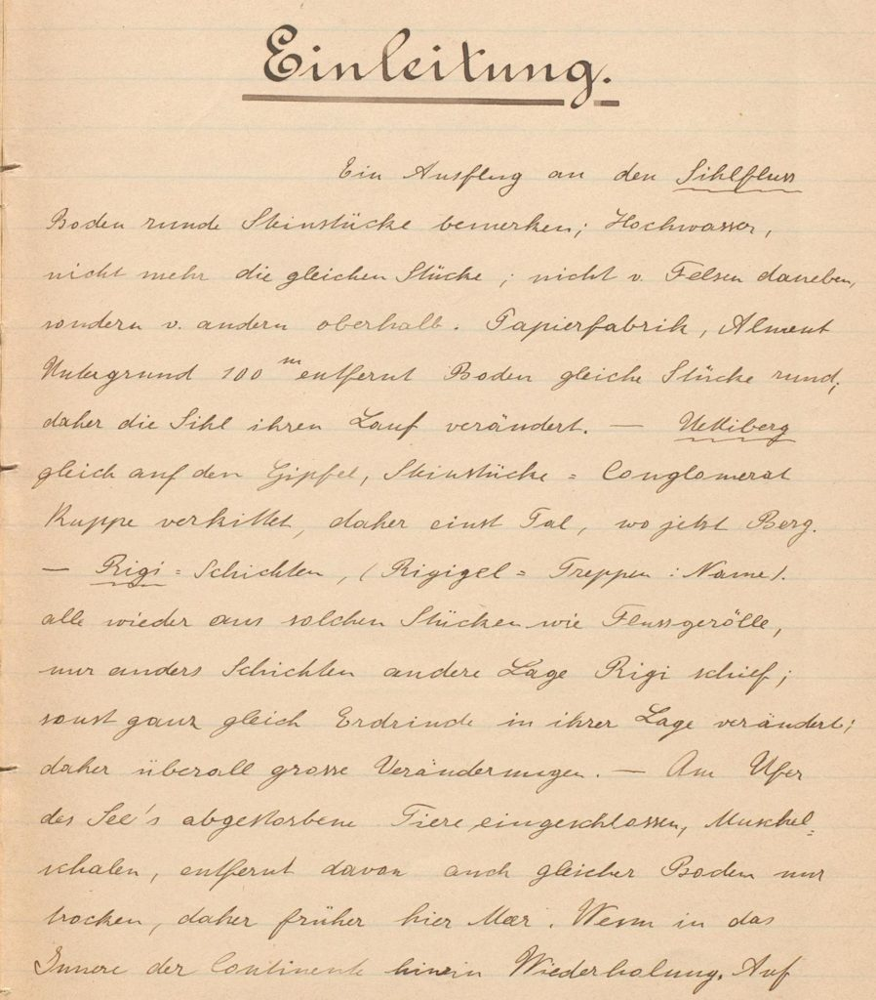

In [6]:
filename = Path("../../data/imgs/handwritten.jpg")
Image(filename=filename.absolute(), width=700)

#### Encoding Image (base64)

In [7]:
def encode_image(input_image: str | Path | PILImage.Image, pdf_page: int = 0):
    """Encode an image or a PDF page to a base64 PNG string.

    Parameters
    ----------
    input_image : str or PIL.Image.Image
        If a string is provided, it is treated as a file path. If the path ends with
        '.pdf', the specified PDF page (pdf_page) will be converted to an image and encoded.
        Otherwise the file at the path is read as binary image data.
    pdf_page : int, optional
        When input_image is a PDF file path, the zero-based page index to convert (default 0).

    Returns:
    -------
    str
        A base64-encoded string representing the image in PNG format (suitable for
        data:image/png;base64,... usage).

    Raises:
    ------
    ValueError
        If input_image is neither a file path string nor a PIL.Image.Image instance.
    """
    if isinstance(input_image, Path):
        input_image = str(input_image.resolve())

    if isinstance(input_image, str):
        # Check if the file is a PDF
        if input_image.lower().endswith(".pdf"):
            pdf = pdfium.PdfDocument(input_image)
            page = pdf.get_page(pdf_page)
            input_image = page.render(scale=2).to_pil()  # should be now PILImage.Image
        else:
            with open(input_image, "rb") as image_file:
                return base64.b64encode(image_file.read()).decode("utf-8")

    if isinstance(input_image, PILImage.Image):
        with io.BytesIO() as buffer:
            input_image.save(buffer, format="PNG")  # Save in PNG format or any other
            byte_data = buffer.getvalue()
            return base64.b64encode(byte_data).decode("utf-8")
    else:
        raise ValueError("Input must be a file path or a PIL image object")

In [8]:
myimage = encode_image(filename)
myimage

'/9j/4AAQSkZJRgABAQEBLAEsAAD/2wBDAAYEBAUEBAYFBQUGBgYHCQ4JCQgICRINDQoOFRIWFhUSFBQXGiEcFxgfGRQUHScdHyIjJSUlFhwpLCgkKyEkJST/2wBDAQYGBgkICREJCREkGBQYJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCT/wAARCAQAA4IDASIAAhEBAxEB/8QAGwAAAgMBAQEAAAAAAAAAAAAAAQIAAwUEBgf/xABIEAABAwMDAgQEBAUCBAUDAQkBAgMRAAQhBRIxQVEGE2FxIjKBkRRCUqEVI2KxwQfRM3Lh8BYkQ4LxF1OSJTSiRGNzg7LCVP/EABkBAQEBAQEBAAAAAAAAAAAAAAABAgMFBv/EACQRAQEBAQADAQEBAQACAwEAAAARASECEjFBUWFxAzIiQoGR/9oADAMBAAIRAxEAPwD660pRuXVHB2piTjrXYyTM9Dz0rjYB/FLBMEJSf713AbZPfpXz3j9e5vxZIKTgzSbgUxJ7ZFNvChJH/SqwTM4UPfiujEDfCsp+1OlQJICTSnMgZx3pk/CIMA/tVQUp4wYplEJxPPFLBVGftTAgK6z0oDt3ERIj96KVKC1SMdIopgHOCaMAjk/WqhiYEgQRzUB46UswmOaIKiIPXmqgyArGcU4UOaQJAOZzTBuCIohscKzP71Ege3pSDdIPI/tTBJIM8f3qgxJAGPagQAYx65qQB6+3SgRuigMjMAGDUKCoSZBNEp2jnPpR2yfm57DigEqVEwD1IFGFE4j61AVfX+9QgmgBAx3oBJjbkzzTDgniKO7dmOv7UCgQNwz/ALUwkj+9QmSD6TSqKuJMDMihQXjafh9JoqSdkT9aICj1nHBFQp2+xP2oAJCI5j70YEfFBPY0N0kjIApQrHaKFOkSrMDoIqKTjocxk0Ek8kwacjryOc96IBwIPQ4jigJjjPrRAG6cd6g6qop

#### Sending request

In [9]:
prompt = "Transcribe the text in the image"
messages = [
    {
        "role": "user",
        "content": [
            {"type": "text", "text": f"{prompt}"},
            {"type": "image_url", "image_url": {"url": f"data:image/png;base64,{myimage}"}},
        ],
    }
]

response = client.chat.completions.create(
    model=llm_model_name,
    messages=messages,
    max_completion_tokens=65536,
)


print(response.choices[0].message.content)

Einleitung.

Ein Ausflug an den Sihlfluss

Boden runde Steinstücke bemerken; Hochwasser,
nicht mehr die gleichen Stücke; nicht v. Felsen daneben,
sondern v. andern oberhalb. Papierfabrik, Aufgrund
Untergrund 100 m entfernt Boden gleiche Stücke rund,
daher die Sihl ihren Lauf verändert. — Wellberg
gleich auf den Gipfel, Steinstücke = Conglomerat
Kuppe verkittet, daher einst Tal, wo jetzt Berg.
— Rigi: Schichten, Riggeli - Treppen: Namen.
alle wieder aus solchen Stücken wie Flussgerölle,
nur andere Schichten andere Lage Rigi schief;
sonst ganz gleich Erdrinde in ihrer Lage verändert;
daher überall grosse Veränderungen. — Am Ufer
des Sees abgestorbene Tiere eingeschlossen, Muschel-
schalen, entfernt davon auch gleicher Boden nur
trocken, daher früher hier Meer. Wenn in das
Innere der Continente hinein Wiederholung. Auf...


## PDF Files

#### Encoding the Image

In [10]:
filename = Path("../../data/pdf/NASDAQ_AMZN_2019.pdf")
encoded_img = encode_image(filename, pdf_page=1)
encoded_img

'iVBORw0KGgoAAAANSUhEUgAABKQAAAYMCAIAAACwkcctAAEAAElEQVR4nOzdd1wUx98H8L0CR0elN0EQRIqAiooNxd57SWIsscTeNc0SaxK7sSX23rtiwYpIUaQqqHQ4Okfn+u3t88flx0Moxx6C5fJ5//J6HtmbnZ2bnZ277+3sDIOiKAIAAAAAAADUC/NTFwAAAAAAAAAaH4I9AAAAAAAANYRgDwAAAAAAQA0h2AMAAAAAAFBDCPYAAAAAAADUEII9AAAAAAAANYRgDwAAAAAAQA0h2AMAAAAAAFBDCPYAAAAAAADUEII9AAAAAAAANYRgDwAAAAAAQA0h2AMAAAAAAFBDCPYAAAAAAADUEII9AAAAAAAANYRgDwAAAAAAQA0h2AMAAAAAAFBDCPYAAAAAAADUEII9AAAAAAAANYRgDwAAAAAAQA0h2AMAAAAAAFBDCPYAAAAAAADUEII9AAAAAAAANYRgDwAAAAAAQA0h2AMAAAAAAFBDCPYAAAAAAADUEII9AAAAAAAANYRgDwAAAAAAQA0h2AMAAAAAAFBDCPYAAAAAAADUEII9AAAAAAAANYRgDwAAAAAAQA0h2AMAAAAAAFBDCPYAAAAAAADUEII9AAAAAAAANYRgDwAAAAAAQA0h2AMAAAAAAFBDCPYAAAAAAADUEII9AAAAAAAANYRgDwAAAAAAQA0h2AMAAAAAAFBDCPYAAAAAAADUEII9AAAAAAAANYRgDwAAAAAAQA0h2AMAAAAAAFBDCPYAAAAAAADUEII9AAAAAAAANYRgDwAAAAAAQA0h2AMAAAAAAFBDCPYAAAAAAADUEII9AAAAAAAANYRgDwAAAAAAQA0h2AMAAAAAAFBDCPYAAAAAAADUEII9AAAAAAAANYRgDwAAAAAAQA0h2AMAAAAAAFBDCPYAAAAAAADUEII9AAAAAAAANYRgDwAAAAAAQA0h2AMAAAAAAFBDCPYAAAAAAADUEII9AAAAAAAANYR

#### Displaying the PDF file (sanity check)

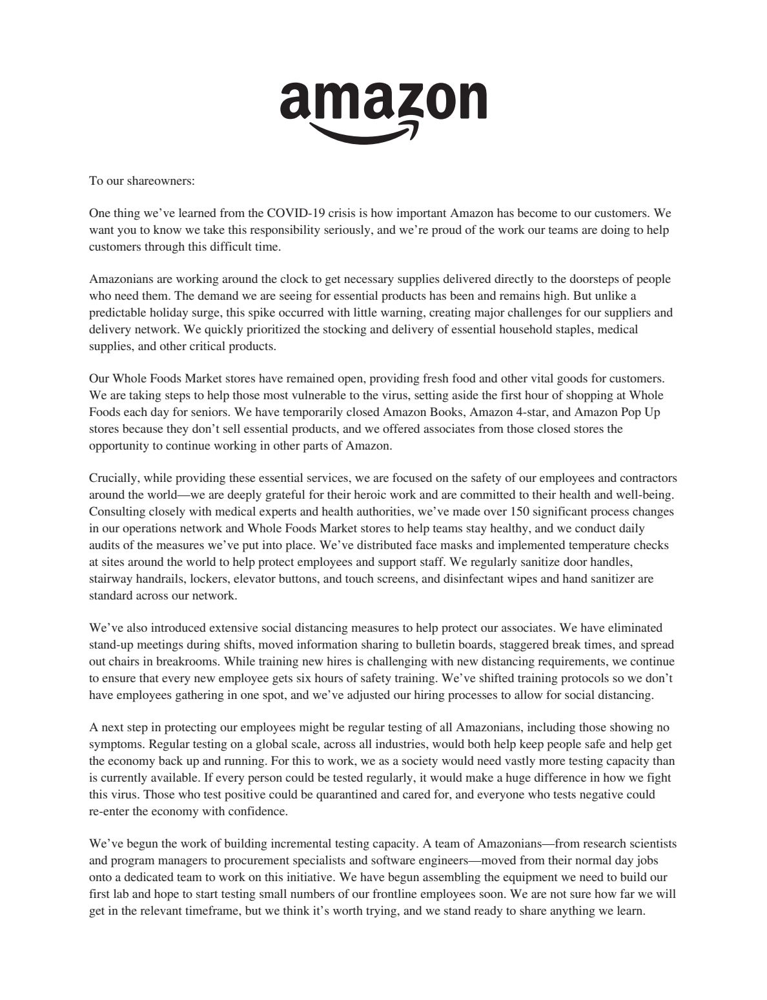

In [11]:
# Sanity Check:
Image(base64.b64decode(encoded_img), width=1200)

#### Sending request

In [ ]:
prompt = "Translate the text content into German"
messages = [
    {
        "role": "system",
        "content": [
            {"type": "text", "text": "You are an expert translator from English to German."}
        ],
    },
    {
        "role": "user",
        "content": [
            {"type": "text", "text": f"{prompt}"},
            {"type": "image_url", "image_url": {"url": f"data:image/png;base64,{encoded_img}"}},
        ],
    },
]

try:
    response = client.chat.completions.create(
        model=llm_model_name,
        messages=messages,
        temperature=1,
        # max_tokens=256,
        top_p=1,
        frequency_penalty=0,
        presence_penalty=0,
    )
    print(response.choices[0].message.content)
except Exception as e:
    print(f"An error occurred: {e}")

An unsere Aktionärinnen und Aktionäre:

Eines, das wir aus der COVID-19-Krise gelernt haben, ist, wie wichtig Amazon für unsere Kundinnen und Kunden geworden ist. Wir möchten, dass Sie wissen, dass wir diese Verantwortung ernst nehmen, und wir sind stolz auf die Arbeit, die unsere Teams leisten, um Kundinnen und Kunden durch diese schwierige Zeit zu helfen.

Amazon-Mitarbeitende arbeiten rund um die Uhr, um notwendige Lieferungen direkt an die Haustüren derjenigen zu bringen, die sie benötigen. Die Nachfrage nach essentiellen Produkten, die wir sehen, war und bleibt hoch. Anders als bei einem vorhersehbaren Feiertagsanstieg trat dieser Schub jedoch mit wenig Vorwarnung ein und stellte unsere Lieferanten und unser Liefernetz vor große Herausforderungen. Wir haben schnell die Bevorratung und Auslieferung essentieller Haushaltsartikel, medizinischer Versorgung und anderer kritischer Produkte priorisiert.

Unsere Whole Foods Market-Filialen sind geöffnet geblieben und versorgen Kundinnen u

#### Wrapping everything in a function  

Example usage:

+ **For image file path**  
image_file_path = 'path/to/image.png'  
prompt = "Can you transcribe this text?"  
result = process_image(image_file_path, prompt)  
print(result)  

+ **For PDF file path**  
pdf_file_path = 'path/to/document.pdf'  
result = process_image(pdf_file_path, prompt)  
print(result)  

+ **For PIL image object**  
image_obj = Image.open('path/to/image.png')  
result = process_image(image_obj, prompt)  
print(result)  

In [79]:
def process_image(
    input_image: str | Path | PILImage.Image,
    prompt: str,
    pdf_page: int = 0,
    detail: str = "low",
    max_tokens: int = 2 ^ 16,
):
    """Send an image (or a PDF page) to the LLM for processing and return the model response.

    Parameters
    ----------
    input_image : str | Path | PIL.Image.Image
        Path to an image file or a PDF file, or a PIL Image object.
        If a PDF path is provided, the `pdf_page` parameter selects which page to render.
    prompt : str
        The prompt text to send to the LLM describing the requested task.
    pdf_page : int, optional
        Zero-based index of the PDF page to render if `input_image` is a PDF. Default is 0.
    detail : str, optional
        Detail level to send in the image metadata (e.g., "low", "high", "auto").
    max_tokens : int, optional
        Maximum number of tokens to request in the completion.

    Returns:
    -------
    str | None
        The assistant's textual response content, or None if an error occurred.
    """
    # Ensure PDF page is passed to the encoder when needed
    base64_encoded = encode_image(input_image, pdf_page=pdf_page)

    messages = [
        {
            "role": "system",
            "content": [
                {
                    "type": "text",
                    "text": "You are an helpful assistant, who always reply in a concise and short way.",
                }
            ],
        },
        {
            "role": "user",
            "content": [
                {"type": "text", "text": f"{prompt}"},
                {
                    "type": "image_url",
                    "image_url": {
                        "url": f"data:image/png;base64,{base64_encoded}",
                        "detail": detail,  # You can set this to "low", "high", or "auto""
                    },
                },
            ],
        },
    ]

    try:
        response = client.chat.completions.create(
            model=llm_model_name,
            messages=messages,
            # temperature=1,
            # max_completion_tokens=max_tokens,
            # top_p=1,
            # frequency_penalty=0,
            # presence_penalty=0,
        )
        return response.choices[0].message.content

    except Exception as e:
        print(f"An error occurred: {e}")
        return None

#### Depending of the hanwriting, the results may not be perfect

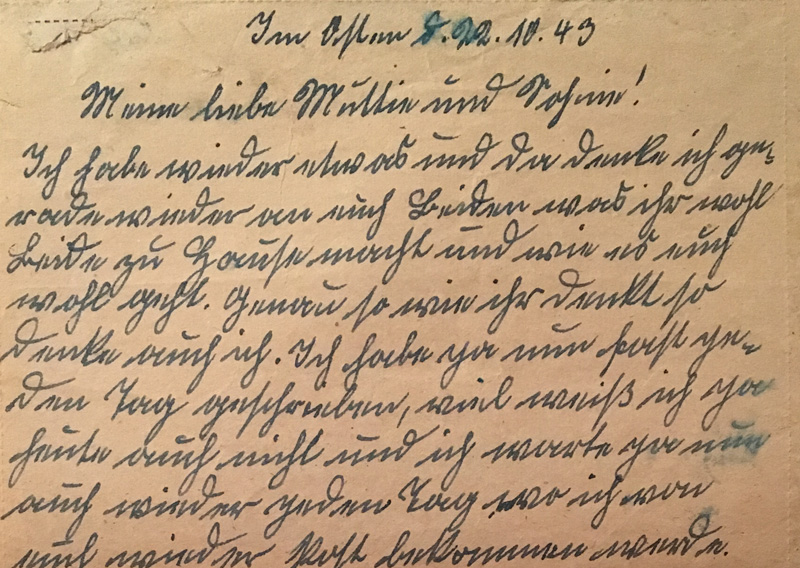

In [77]:
filename = Path("../../data/imgs/handwritten2.jpg")
Image(filename=filename, width=500)

In [80]:
prompt = "Can you transcribe this text?"
print(process_image(filename, prompt, detail="high"))

Here’s my best-read transcription; uncertain or illegible words are shown in brackets.

Im Osten d. 22.10.43

Meine liebe Mutti und Vati!

Ich habe wieder alles erhalten und den Dank ist ganz
[groß] wieder von euch. Leider war ich [noch]
heute zu Hause [mußte] mich und mir ist nicht
so gut. [Immer] so mein ist dankt so
Danke nochmals ich. Ich habe gar nur [schriftlich]
den Brief aufgeschrieben, weil weiß ich gar
genau nicht und ich warte jetzt noch
auf wieder guten [Brief] was ich [??]
und meinen [??] bekommen werden.

If you can upload a higher-resolution or more of the letter I can try a more accurate transcription.


### Translation

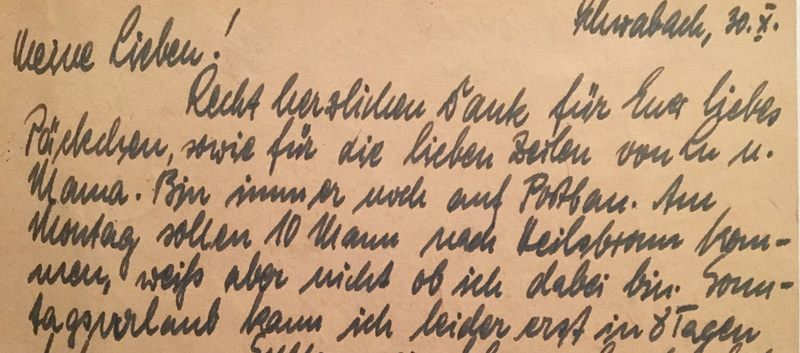

In [81]:
filename = Path("../../data/imgs/handwritten3.jpg")
Image(filename=filename, width=500)

In [82]:
prompt = "Can you translate this text to English?"
print(process_image(filename, prompt, detail="low"))

My dears!
Many heartfelt thanks for your lovely parcels and for the kind lines from Mama. I’m still on duty. On Monday ten men are supposed to go to [place name unclear]; I don’t know whether that will be the case. As for a Sunday leave, unfortunately I can only get it in three days.


### Extraction

In [83]:
prompt = "What is the name of the brand in this PDF Page?"
filename = Path("../../data/pdf/NASDAQ_AMZN_2019.pdf")
print(process_image(filename, prompt, pdf_page=1))

Amazon


### Description

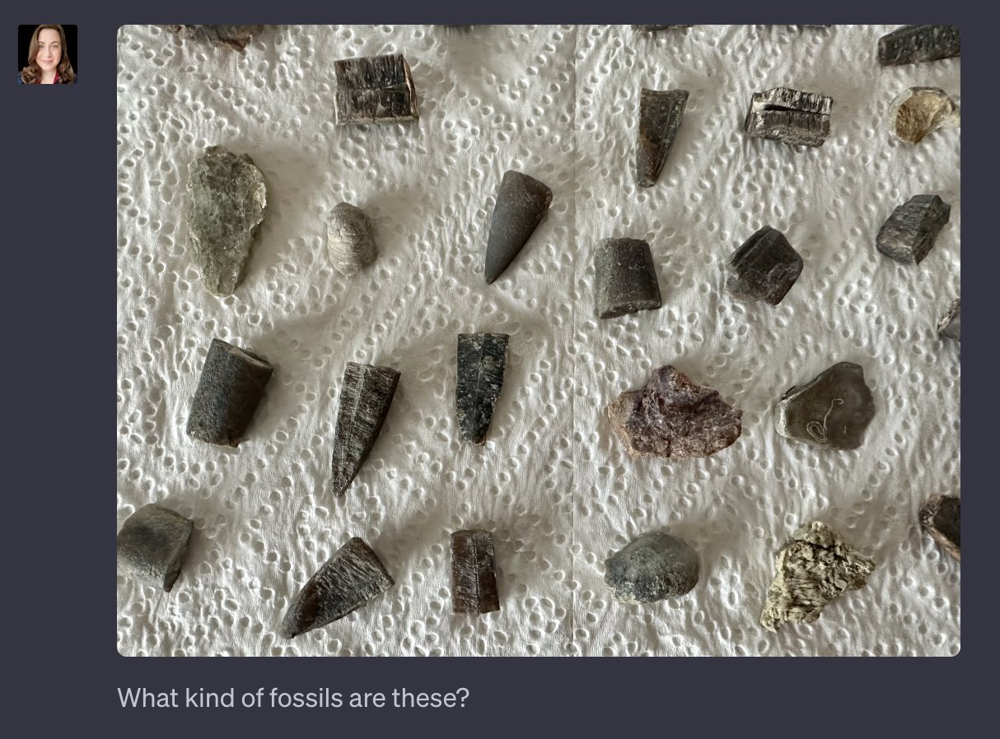

In [84]:
filename = "../../data/imgs/fossils.jpeg"
Image(filename=filename, width=500)

In [85]:
prompt = "Can you describe this image?"
print(process_image(filename, prompt))

A spread of small dark fossil fragments on a paper towel—mostly pointed, conical pieces that look like isolated teeth and a few irregular bone/rock fragments. The teeth are thick, non‑serrated cones typical of fish (e.g., gar/other bony fish) or small shark/marine reptile teeth; a couple pieces show mineralized/crystalline (pyritized) surfaces. To confirm, compare with local fossil guides or have a paleontology expert or museum staff examine them with locality info.


### Interpretation

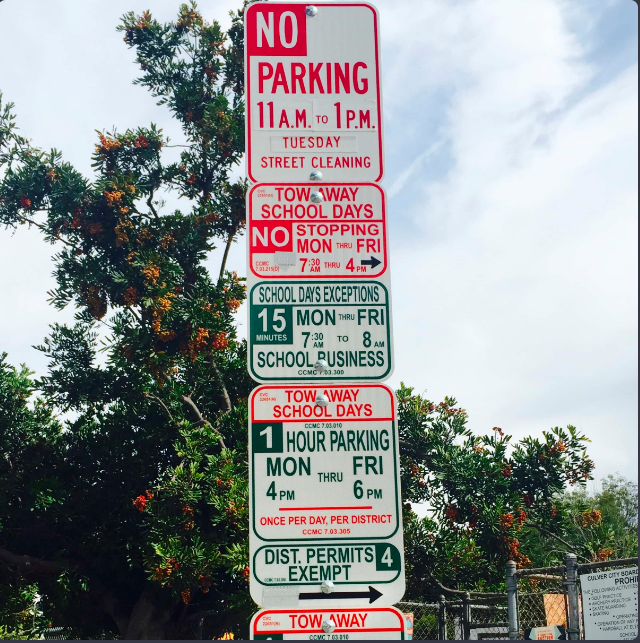

In [86]:
filename = "../../data/imgs/Sign.png"
Image(filename=filename, width=500)

In [87]:
from datetime import datetime

# Get today's date
today = datetime.today()

# Get the full weekday name
weekday_name = today.strftime("%A")
print(weekday_name)  # Example: "Friday"

Sunday


In [88]:
now = datetime.now()

# Format the time (HH:MM:SS)
current_time = now.strftime("%H:%M:%S")
print("Current Time:", current_time)

Current Time: 14:19:02


In [89]:
prompt = f"It is {weekday_name} at {current_time}. Can I park in this spot right now? For how long?"
# prompt = "What is the type of tree behind the sign? Answer in one line"
print(process_image(filename, prompt))

Yes. It’s Sunday 2:19 PM — the signs restrict Tue street‑cleaning and Mon–Fri school hours. No Sunday limit is posted, so you may park now until the weekday restrictions resume (e.g. Monday school‑hour rules or Tuesday 11 AM–1 PM street cleaning).


### Technical Aspects

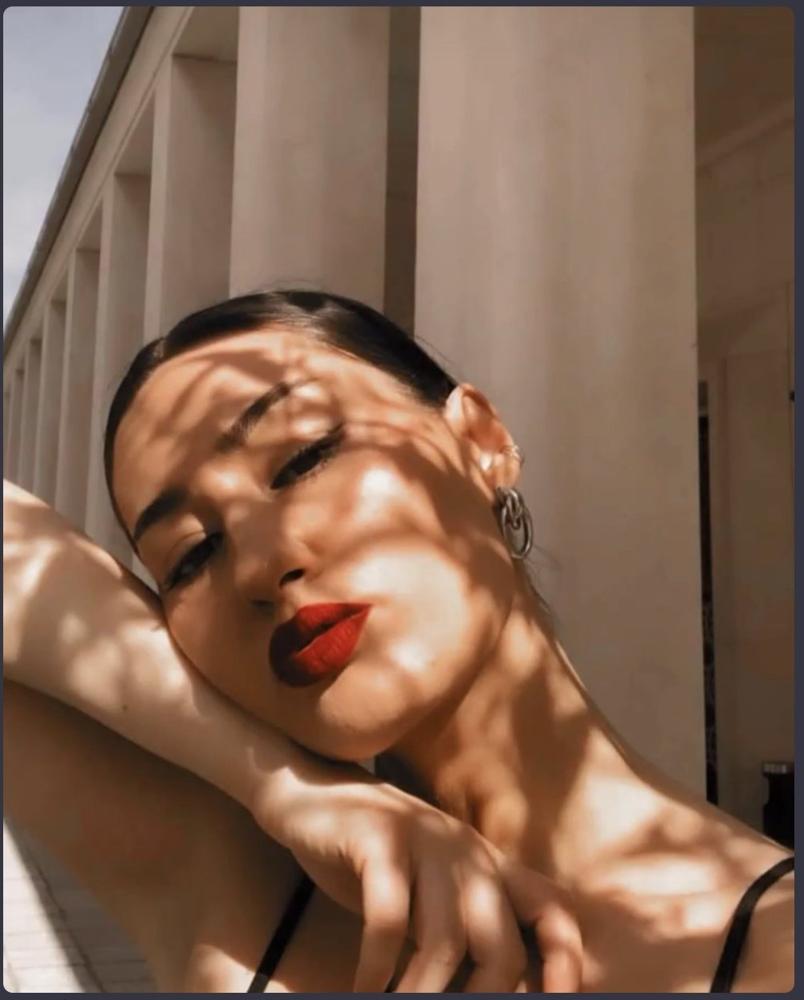

In [90]:
filename = "../../data/imgs/Lightroom.jpeg"
Image(filename=filename, width=500)

In [91]:
# app_name = "Lightroom"
app_name = "TikTok"
prompt = f"""
What are the image editing techniques or effects {app_name} used in this image?
I just need the technical information
I need detailed numeric values for each setting.
It is ok to approximate. Think step by step"
"""
print(process_image(filename, prompt))

1) Crop/Canvas
- Aspect: 3:4 portrait (e.g., 768×1024 px)
- Framing: slight top crop (~5% from top)

2) Exposure & Contrast
- Exposure: -0.20 EV
- Contrast: +22

3) Tone (Lightroom-style)
- Highlights: -60
- Shadows: +35
- Whites: -20
- Blacks: -12
- Tone curve (RGB): slight S — points approx (0,0),(25,20),(50,48),(75,80),(100,100)

4) Color temperature / Vibrance
- Temp: ~6000 K (warm, ~+8 on 0–100 slider)
- Tint: +6 (magentized)
- Vibrance: +10
- Saturation: -6

5) Color grading / split toning
- Highlights hue ~40° (warm orange), sat ~18
- Midtones hue ~35°, sat ~20
- Shadows hue ~200° (teal), sat ~8
- Balance toward highlights: +10

6) Clarity / Texture / Dehaze
- Clarity: -12 (soften)
- Texture: -20 (skin smoothing)
- Dehaze: +3

7) Sharpening / Noise reduction
- Sharpening amount: 30
- Radius: 1.0 px
- Detail: 15
- Masking: 40
- Luminance NR: 8, Detail 50

8) Local adjustments (dodging & burning)
- Local highlight dodge on skin: +0.30 EV, Clarity -20
- Local shadow burn on edges: 

#### A Math problem

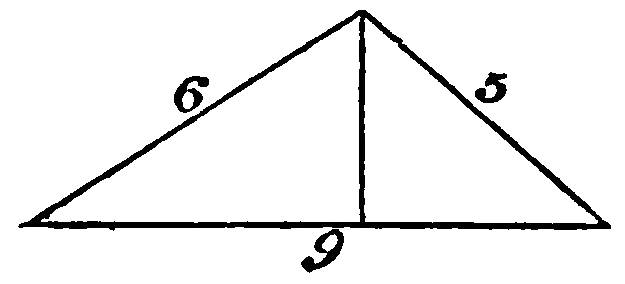

In [92]:
filename = "../../data/imgs/triangle.png"
Image(filename=filename, width=500)

In [94]:
base64_image = encode_image(filename)

response = client.chat.completions.create(
    model=llm_model_name,
    messages=[
        {
            "role": "system",
            "content": "You are a helpful assistant that responds in Latex. Help me with my math homework!",
        },
        {
            "role": "user",
            "content": [
                {"type": "text", "text": "What's the area of the triangle?"},
                {
                    "type": "image_url",
                    "image_url": {"url": f"data:image/png;base64,{base64_image}"},
                },
            ],
        },
    ],
)

Markdown(response.choices[0].message.content)

\[
\begin{aligned}
s&=\frac{6+5+9}{2}=10,\\
[A]&=\sqrt{s(s-6)(s-5)(s-9)}=\sqrt{10\cdot4\cdot5\cdot1}=\sqrt{200}=10\sqrt2.
\end{aligned}
\]

So the area of the triangle is \(10\sqrt2\).

In [ ]:
# If it isn't shown properly, try this:
display(Markdown(f"$${response.choices[0].message.content}$$"))

$$\[
\begin{aligned}
s&=\frac{6+5+9}{2}=10,\\
[A]&=\sqrt{s(s-6)(s-5)(s-9)}=\sqrt{10\cdot4\cdot5\cdot1}=\sqrt{200}=10\sqrt2.
\end{aligned}
\]

So the area of the triangle is \(10\sqrt2\).$$

#### Using a URL instead of an image:  
When using a URL for an external image, there is no need to encode the image.

In [ ]:
# Image(url="https://upload.wikimedia.org/wikipedia/commons/e/e2/The_Algebra_of_Mohammed_Ben_Musa_-_page_82b.png")
Image(url="https://i.ytimg.com/vi/nTB6pdf2ae4/hq720.jpg")

In [96]:
response = client.chat.completions.create(
    model=llm_model_name,
    messages=[
        {
            "role": "system",
            "content": "You are a helpful assistant that responds in Markdown. Help me with my math homework!",
        },
        {
            "role": "user",
            "content": [
                {"type": "text", "text": "Can you solve this problem?"},
                {
                    "type": "image_url",
                    "image_url": {"url": "https://i.ytimg.com/vi/nTB6pdf2ae4/hq720.jpg"},
                },
            ],
        },
    ],
)

print(response.choices[0].message.content)

We solve a^3 + a^2 = 36, i.e.
a^3 + a^2 − 36 = 0.

Try integer roots: a = 3 gives 27 + 9 − 36 = 0, so (a − 3) is a factor. Divide:
a^3 + a^2 + 0·a − 36 = (a − 3)(a^2 + 4a + 12).

Solve a^2 + 4a + 12 = 0:
a = [−4 ± sqrt(16 − 48)]/2 = −2 ± i·2√2.

Thus the solutions are
- a = 3 (the only real solution),
- a = −2 + 2i√2,
- a = −2 − 2i√2.


### A full pipeline: Working with many images

#### A function to resize the images

In [12]:
def resize_image(image: PILImage.Image, max_dimension: int):
    """Resizes the image based on the max_dimension."""
    timestamp_1 = time.time()
    width, height = image.size

    # Check if the image has a palette and convert it to true color mode
    if image.mode == "P":
        if "transparency" in image.info:
            image = image.convert("RGBA")
        else:
            image = image.convert("RGB")

    if width > max_dimension or height > max_dimension:
        if width > height:
            new_width = max_dimension
            new_height = int(height * (max_dimension / width))
        else:
            new_height = max_dimension
            new_width = int(width * (max_dimension / height))
        image = image.resize((new_width, new_height), PILImage.Resampling.LANCZOS)
    timestamp_2 = time.time()
    print(f"Execution time: {timestamp_2 - timestamp_1}")
    return image

#### A function to convert to PNG format

In [13]:
def convert_to_png(image: PILImage.Image):
    """Converts an image to a PNG format."""
    with io.BytesIO() as output:
        image.save(output, format="PNG")
        return output.getvalue()

#### Processing = converting, resizing and encoding

In [14]:
def process_image(path: str | Path, max_size: int):
    """Given a path, prepare the image by resizing and converting it to PNG."""
    with PILImage.open(path) as image:
        width, height = image.size
        mimetype = image.get_format_mimetype()
        if mimetype == "image/png" and width <= max_size and height <= max_size:
            with open(path, "rb") as f:
                encoded_image = base64.b64encode(f.read()).decode("utf-8")
                return (encoded_image, max(width, height))  # returns a tuple consistently
        else:
            resized_image = resize_image(image, max_size)
            png_image = convert_to_png(resized_image)
            return (
                base64.b64encode(png_image).decode("utf-8"),
                max(width, height),  # same tuple metadata
            )

#### A function to decide if the image will be treated as low or high definition

In [15]:
def create_image_content(image: str, maxdim: int, detail_threshold: int):
    """Creates the OpenAI message image part."""
    detail = "low" if maxdim < detail_threshold else "high"
    return {
        "type": "image_url",
        "image_url": {"url": f"data:image/jpeg;base64,{image}", "detail": detail},
    }

#### Setting the System and User messages

In [16]:
from typing import Optional


def set_system_message(sysmsg):
    """Sets the prompt for the system."""
    return [{"role": "system", "content": {"text": sysmsg}}]


def set_user_message(
    user_msg_str: str,
    file_path_list: list = [],  # A list of file paths to images.
    max_size_px: int = 1024,  # Shrink images for lower API consumption
    file_names_list: Optional[list] = None,  # You can set original upload names to show AI
    tiled: bool = False,  # True is the API Reference method
    detail_threshold: int = 700,  # any images below this get 512px "low" mode
):
    """Prepares the OpenAI chat message."""
    if not isinstance(file_path_list, list):  # create empty list for weird input
        file_path_list = []

    if not file_path_list:  # no files, no tiles
        tiled = False

    if file_names_list and len(file_names_list) == len(file_path_list):
        file_names = file_names_list
    else:
        file_names = [os.path.basename(path) for path in file_path_list]

    base64_images = [process_image(path, max_size_px) for path in file_path_list]

    uploaded_images_text = ""
    if file_names:
        uploaded_images_text = "\n\n---\n\nUploaded images:\n" + "\n".join(file_names)

    if tiled:
        content = [{"type": "text", "text": user_msg_str + uploaded_images_text}]
        content += [
            create_image_content(image, maxdim, detail_threshold) for image, maxdim in base64_images
        ]
        return [{"role": "user", "content": {"messages": content}}]
    else:
        return [
            {
                "role": "user",
                "content": {
                    "messages": [user_msg_str + uploaded_images_text]
                    + [{"image": image} for image, _ in base64_images]
                },
            }
        ]

In [19]:
system_msg = """
You are VisionPal, an AI assistant powered by GPT-4o with
Built-in vision capabilities:
- extract text from image
- describe images
- analyze image contents
- logical problem-solving requiring machine vision
""".strip()

user_msg = """
How many images were received?
Describe the contents.
Describe the quality.
Repeat back the file names sent.
""".strip()

max_size = 512  # downsizes if any dimension above this
image_paths = [
    "../../data/imgs/handwritten.jpg",
    "../../data/imgs/handwritten2.jpg",
    "../../data/imgs/handwritten3.jpg",
]

In [28]:
system = set_system_message(system_msg)
chat_hist = []  # list of more user/assistant items
user = set_user_message(user_msg, image_paths, max_size)

params = {
    "model": llm_model_name,
    "temperature": 1,
    "user": "my_customer",
    "max_completion_tokens": 2048,
    "stream": True,
    "messages": system + chat_hist + user,
}

# Fixing malformed parameters. Can be refactored

if isinstance(params["messages"][0]["content"], dict):
    params["messages"][0]["content"] = params["messages"][0]["content"]["text"]

if isinstance(params["messages"][1]["content"], dict):
    text_part = params["messages"][1]["content"]["messages"][0]  # Extract text
    image_part = params["messages"][1]["content"]["messages"][1]  # Extract image
    params["messages"][1]["content"] = [
        {"type": "text", "text": text_part},
        {"type": "image_url", "image_url": {"url": f"data:image/png;base64,{image_part['image']}"}},
    ]

Execution time: 0.017091751098632812
Execution time: 0.009569406509399414
Execution time: 0.006792783737182617


#### Making the call:

In [29]:
start = time.perf_counter()
try:
    client = AzureOpenAI(
        api_key=subscription_api_key,
        api_version=api_version,
        azure_endpoint=llm_endpoint,
    )
    response = client.chat.completions.create(**params)
    reply = ""

    if params.get("stream", False):  # Check if streaming
        print(f"---\nSENT:\n{params['messages'][-1]['content'][0]['text']}\n---")

    for chunk in response:
        if hasattr(chunk, "choices") and chunk.choices:  # Ensure choices exist
            delta = chunk.choices[0].delta
            if hasattr(delta, "content") and delta.content:
                reply += delta.content
                print(delta.content, end="")
        else:
            print("\n[Warning] Empty chunk received:", chunk)

    print("\n---\nFinal Reply:\n", reply)

except Exception as e:
    print(f"Error during API call: {e}")
    response = None

print(f"\n[elapsed: {time.perf_counter() - start:.2f} seconds]")

---
SENT:
How many images were received?
Describe the contents.
Describe the quality.
Repeat back the file names sent.

---

Uploaded images:
handwritten.jpg
handwritten2.jpg
handwritten3.jpg
---

[Warning] Empty chunk received: ChatCompletionChunk(id='', choices=[], created=0, model='', object='', service_tier=None, system_fingerprint=None, usage=None, prompt_filter_results=[{'prompt_index': 0, 'content_filter_results': {'hate': {'filtered': False, 'severity': 'safe'}, 'jailbreak': {'filtered': False, 'detected': False}, 'self_harm': {'filtered': False, 'severity': 'safe'}, 'sexual': {'filtered': False, 'severity': 'safe'}, 'violence': {'filtered': False, 'severity': 'safe'}}}])
- Number of images received: 3.

- Contents (summary):
  - Three photographs/scans of lined notebook pages containing continuous, dense handwritten text in German. The pages look like consecutive pages from the same notebook and are written in an older cursive script (appears to be Kurrent/Sütterlin-style or o

## [Speech to text with Whisper](https://platform.openai.com/docs/guides/speech-to-text)  
[Github](https://github.com/openai/whisper)  

![](https://raw.githubusercontent.com/openai/whisper/main/approach.png)

### 2.1 Transcriptions and Translations

In [ ]:
# from openai import OpenAI
# client = OpenAI()

In [ ]:
filename = r"./Data/mp3/sound_english.mp3"
Audio(filename=filename, autoplay=True, rate=22050)

In [ ]:
audio_file = open(filename, "rb")

try:
    transcription = client.audio.transcriptions.create(
        model="whisper-1",
        file=audio_file,
    )
    print(transcription.text)
except Exception as e:
    print("API Error:", e)

Hello students, how are you? this is a Speech recorded in English. I will show you how to use whisper and OpenAI model to convert this speech into text See you


In [ ]:
filename = r"./Data/mp3/sound_german.mp3"
Audio(filename=filename, autoplay=True, rate=22050)

In [ ]:
audio_file = open(filename, "rb")

try:
    transcription = client.audio.transcriptions.create(
        model="whisper-1",
        file=audio_file,
    )
    print(transcription.text)
except Exception as e:
    print("API Error:", e)

Hallo Studenten, wisst ihr, mein Deutsch ist nicht gut. Lasst es uns trotzdem versuchen.


### [Translations](https://platform.openai.com/docs/api-reference/audio/createTranslation?lang=python)  
It only supports translation into English at this time.  
[Supported Languages](https://github.com/openai/whisper#available-models-and-languages)  

In [ ]:
filename = r"./Data/mp3/sound_portuguese.mp3"
Audio(filename=filename, autoplay=True, rate=22050)

In [ ]:
audio_file = open(filename, "rb")

try:
    transcription = client.audio.translations.create(
        model="whisper-1",
        file=audio_file,
        prompt="Translate audio from original Portuguese to English",
    )
    print(transcription.text)
except Exception as e:
    print("API Error:", e)

Dear students, now I'm speaking in Portuguese. Will the translation work properly?


### [Correcting transcriptions with ChatGPT](https://platform.openai.com/docs/guides/speech-to-text/improving-reliability)

```
system_prompt = """You are a helpful assistant for the company ZyntriQix.
Your task is to correct any spelling discrepancies in the transcribed text.
Make sure that the names of the following products are spelled correctly:
ZyntriQix, Digique Plus, CynapseFive, VortiQore V8, EchoNix Array, OrbitalLink
Seven, DigiFractal Matrix, PULSE, RAPT, B.R.I.C.K., Q.U.A.R.T.Z., F.L.I.N.T.
Only add necessary punctuation such as periods, commas, and capitalization,
and use only the context provided."""

def generate_corrected_transcript(temperature, system_prompt, audio_file):
    response = client.chat.completions.create(
        model="gpt-4o",
        temperature=temperature,
        messages=[
            {
                "role": "system",
                "content": system_prompt
            },
            {
                "role": "user",
                "content": transcribe(audio_file, "")
            }
        ]
    )
    return completion.choices[0].message.content

corrected_text = generate_corrected_transcript(0, system_prompt, fake_company_filepath)
```

## [Text to speech](https://platform.openai.com/docs/guides/text-to-speech)  
The Audio API provides a speech endpoint based on our TTS (text-to-speech) model.   
It comes with 6 built-in voices: ["alloy","echo","fable","onyx","nova","shimmer"] and can be used to:
+ Narrate a written blog post
+ Produce spoken audio in multiple languages
+ Give real time audio output using streaming

The default response format is "mp3", but other formats like "opus", "aac", "flac", and "pcm" are available.

+ Opus: For internet streaming and communication, low latency.
+ AAC: For digital audio compression, preferred by YouTube, Android, iOS.
+ FLAC: For lossless audio compression, favored by audio enthusiasts for archiving.
+ WAV: Uncompressed WAV audio, suitable for low-latency applications to avoid decoding overhead.
+ PCM: Similar to WAV but containing the raw samples in 24kHz (16-bit signed, low-endian), without the header.

In [ ]:
foutput = "mp3"
speech_file_path = f"./Data/output_speech_file.{foutput}"
response = client.audio.speech.create(
    model="tts-1",
    response_format=foutput,
    voice="echo",  # ["alloy","echo","fable","onyx","nova","shimmer"]
    input="I am very glad to be teaching here, You are wonderful students!",
)


response.write_to_file(speech_file_path)

In [ ]:
filename = speech_file_path
Audio(filename=filename, autoplay=True, rate=22050)

## [Text to Image (Dall-e)](https://platform.openai.com/docs/guides/images/usage)  

The Images API provides three methods for interacting with images:

+ Creating images from scratch based on a text prompt (DALL·E 3 and DALL·E 2)
+ Creating edited versions of images by having the model replace some areas of a pre-existing image, based on a new text prompt (DALL·E 2 only)
+ Creating variations of an existing image (DALL·E 2 only)

### Generations

The image generations endpoint allows you to create an original image given a text prompt. When using DALL·E 3, images can have a size of 1024x1024, 1024x1792 or 1792x1024 pixels.

By default, images are generated at standard quality, but when using DALL·E 3 you can set quality: "hd" for enhanced detail. Square, standard quality images are the fastest to generate.

You can request 1 image at a time with DALL·E 3 (request more by making parallel requests) or up to 10 images at a time using DALL·E 2 with the n parameter.

In [ ]:
response = client.images.generate(
    model="dall-e-3",
    prompt="A class about Generative AI in the University of Vienna",
    size="1024x1024",
    quality="standard",
    response_format="url",  #'b64_json',
    n=1,
)

In [98]:
Image(url=response.data[0].url)

In [ ]:
response = client.images.generate(
    model="dall-e-3",
    prompt="A futuristic view of Vienna",
    size="1024x1024",
    quality="standard",
    response_format="b64_json",
    n=1,
)

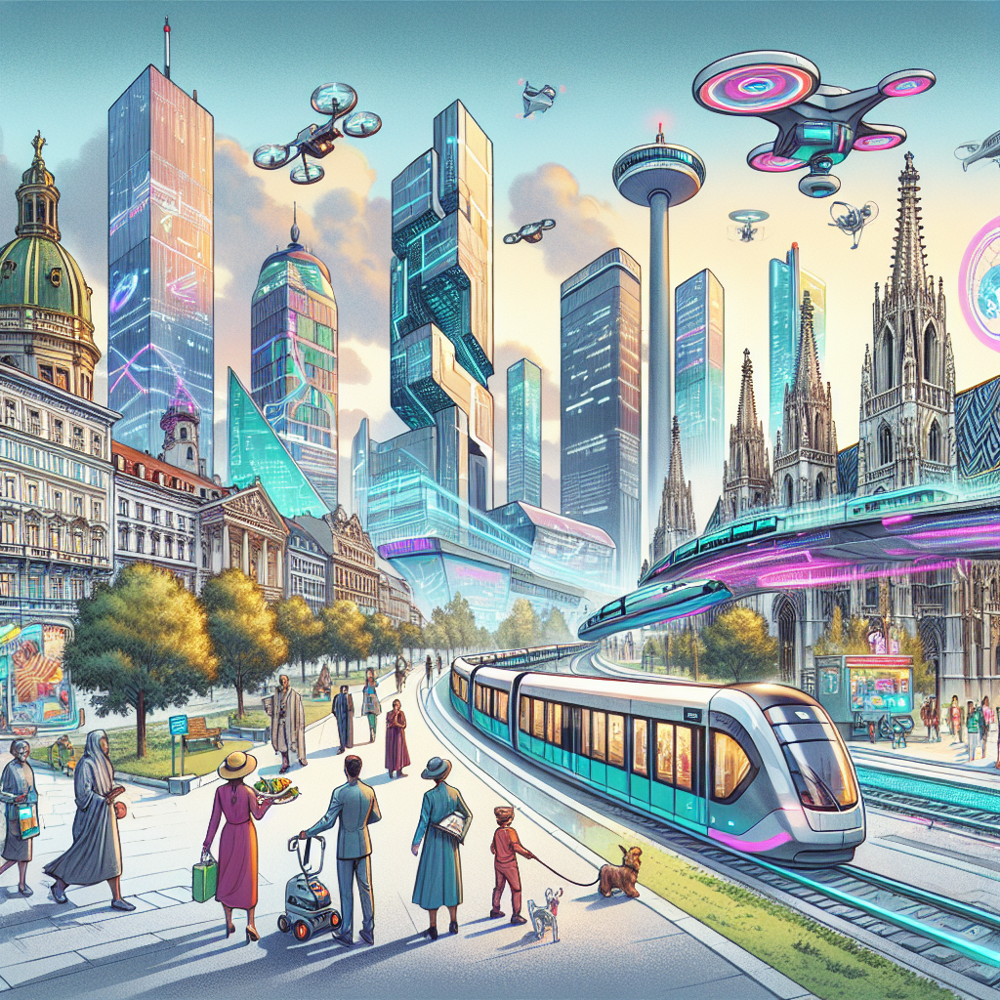

In [ ]:
# import base64
Image(base64.decodebytes(str.encode(response.data[0].b64_json)))

In [101]:
with open("./Data/imgs/imageToSave.png", "wb") as f:
    f.write(base64.decodebytes(str.encode(response.data[0].b64_json)))

### Edits  

Also known as "inpainting", the image edits endpoint allows you to edit or extend an image by uploading an image and mask indicating which areas should be replaced. The transparent areas of the mask indicate where the image should be edited, and the prompt should describe the full new image, not just the erased area. This endpoint can enable experiences like DALL·E image editing in ChatGPT Plus.

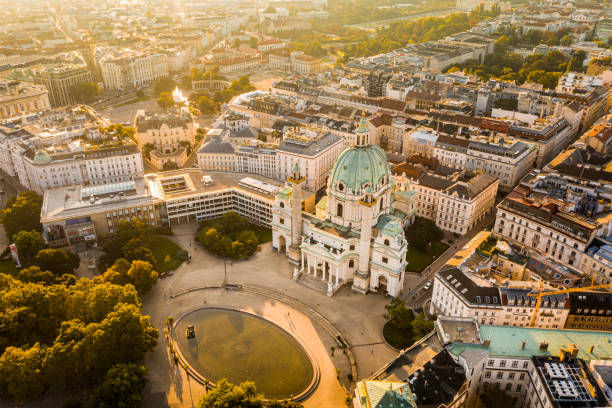

In [102]:
Image("./Data/imgs/Vienna_image.png")

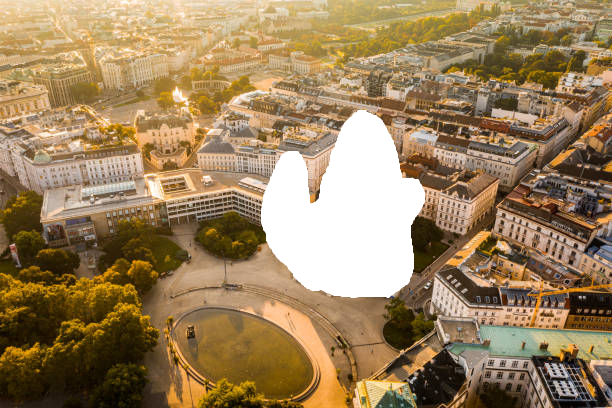

In [103]:
Image("./Data/imgs/Vienna_mask.png")

In [ ]:
response = client.images.edit(
    model="dall-e-2",
    image=open("./Data/imgs/Vienna_image.png", "rb"),
    mask=open("./Data/imgs/Vienna_mask.png", "rb"),
    prompt="A new ferris whell in the heart of Vienna",
    response_format="b64_json",
    n=1,
    size="512x512",
)

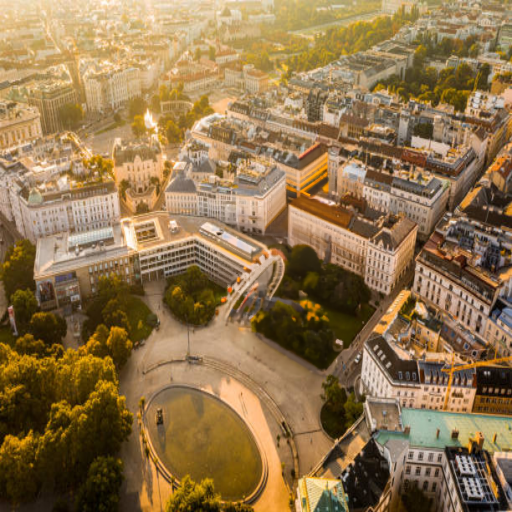

In [ ]:
# Image(url=response.data[0].url)
Image(base64.decodebytes(str.encode(response.data[0].b64_json)))

In [106]:
with open("./Data/imgs/imageToSave2.png", "wb") as f:
    f.write(base64.decodebytes(str.encode(response.data[0].b64_json)))

### Variations (DALL·E 2 only)  
The image variations endpoint allows you to generate a variation of a given image.

In [ ]:
response = client.images.create_variation(
    model="dall-e-2",
    image=open("./Data/imgs/Vienna_image.png", "rb"),
    n=1,
    response_format="b64_json",
    size="512x512",
)

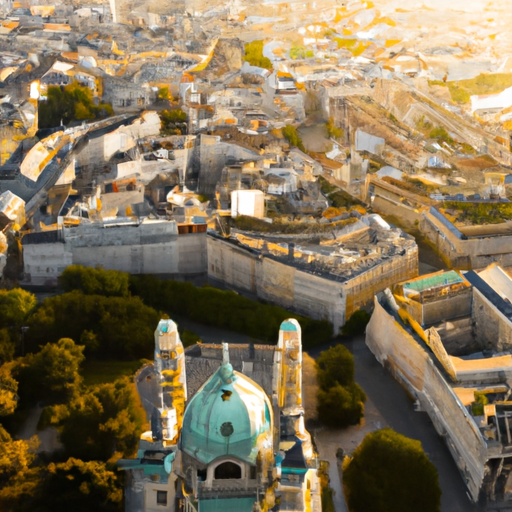

In [108]:
Image(base64.decodebytes(str.encode(response.data[0].b64_json)))

## Video Processing  
While it's not possible to directly send a video to the API, GPT-4o can understand videos if you sample frames and then provide them as images. It performs better at this task than GPT-4 Turbo.

Since GPT-4o in the API does not yet support audio-in (as of Jun 2024), we'll use a combination of GPT-4o and Whisper to process both the audio and visual for a provided video, and showcase two usecases:
1. Summarization
2. Question and Answering

### Setup for Video Processing
We'll use two python packages for video processing - opencv-python and moviepy.

These require [ffmpeg](https://ffmpeg.org/about.html), so make sure to install this beforehand. Depending on your OS, you may need to run `brew install ffmpeg` or `sudo apt install ffmpeg`

In [109]:
%pip install opencv-python --quiet
%pip install --upgrade moviepy
%pip install -U imageio-ffmpeg

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.7/126.7 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 43.3 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: pillow 11.1.0
    Uninstalling pillow-11.1.0:
      Successfully uninstalled pillow-11.1.0
  Attempting uninstall: moviepy
    Found existing installation: moviepy 1.0.3
    Uninstalling moviepy-1.0.3:
      Successfully uninstalled moviepy-1.0.3


### Process the video into two components: frames and audio

In [110]:
import cv2
import imageio
from moviepy.video.io.VideoFileClip import VideoFileClip

# We'll be using the OpenAI DevDay Keynote Recap video. You can review the video here: https://www.youtube.com/watch?v=h02ti0Bl6zk
VIDEO_PATH = "./Data/mp3/keynote_recap.mp4"

In [ ]:
def process_video(video_path, seconds_per_frame=5):
    base64Frames = []
    base_video_path, _ = os.path.splitext(video_path)

    video = cv2.VideoCapture(video_path)
    total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
    fps = video.get(cv2.CAP_PROP_FPS)
    frames_to_skip = int(fps * seconds_per_frame)
    curr_frame = 0

    # Loop through the video and extract frames at specified sampling rate
    while curr_frame < total_frames - 1:
        video.set(cv2.CAP_PROP_POS_FRAMES, curr_frame)
        success, frame = video.read()
        if not success:
            break
        _, buffer = cv2.imencode(".jpg", frame)
        base64Frames.append(base64.b64encode(buffer).decode("utf-8"))
        curr_frame += frames_to_skip
    video.release()

    # Extract audio from video
    audio_path = f"{base_video_path}.mp3"
    clip = VideoFileClip(video_path)
    clip.audio.write_audiofile(audio_path, bitrate="32k")
    clip.audio.close()
    clip.close()

    print(f"Extracted {len(base64Frames)} frames")
    print(f"Extracted audio to {audio_path}")
    return base64Frames, audio_path


# Extract 1 frame per second. You can adjust the `seconds_per_frame` parameter to change the sampling rate
base64Frames, audio_path = process_video(VIDEO_PATH, seconds_per_frame=10)


{'video_found': True, 'audio_found': True, 'metadata': {'major_brand': 'mp42', 'minor_version': '0', 'compatible_brands': 'isommp42', 'creation_time': '2023-12-05T19:15:46.000000Z'}, 'inputs': [{'streams': [{'input_number': 0, 'stream_number': 0, 'stream_type': 'video', 'language': None, 'default': True, 'size': [1280, 720], 'bitrate': 191, 'fps': 29.97002997002997, 'codec_name': 'h264', 'profile': '(Main)', 'metadata': {'Metadata': '', 'creation_time': '2023-12-05T19:15:46.000000Z', 'handler_name': 'ISO Media file produced by Google Inc. Created on: 12/05/2023.', 'vendor_id': '[0][0][0][0]'}}, {'input_number': 0, 'stream_number': 1, 'stream_type': 'audio', 'language': 'eng', 'default': True, 'fps': 44100, 'bitrate': 127, 'metadata': {'Metadata': '', 'creation_time': '2023-12-05T19:15:46.000000Z', 'handler_name': 'ISO Media file produced by Google Inc. Created on: 12/05/2023.', 'vendor_id': '[0][0][0][0]'}}], 'input_number': 0}], 'duration': 211.0, 'bitrate': 323, 'start': 0.0, 'defaul

MoviePy - Done.
Extracted 22 frames
Extracted audio to ./Data/mp3/keynote_recap.mp3


In [118]:
print(f"{len(base64Frames)} frames extracted")

22 frames extracted


In [ ]:
from IPython.display import Audio, Image, display, update_display

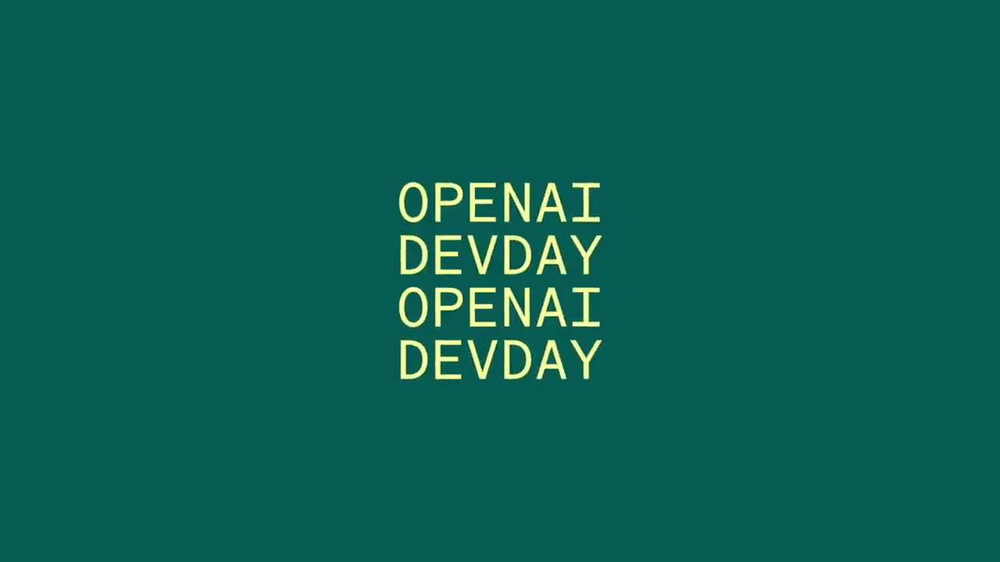

In [ ]:
# Show an empty display at first
display_id = "frame_display"
display(Image(data=b""), display_id=display_id)

# Loop through frames and update display
for img in base64Frames:
    update_display(
        Image(data=base64.b64decode(img.encode("utf-8")), width=600), display_id=display_id
    )
    time.sleep(0.1)

In [115]:
# Play the audio
Audio(audio_path)

### Example 1: Summarization
Now that we have both the video frames and the audio, let's run a few different tests to generate a video summary to compare the results of using the models with different modalities. We should expect to see that the summary generated with context from both visual and audio inputs will be the most accurate, as the model is able to use the entire context from the video.

1. Visual Summary
2. Audio Summary
3. Visual + Audio Summary

#### Visual Summary
The visual summary is generated by sending the model only the frames from the video. With just the frames, the model is likely to capture the visual aspects, but will miss any details discussed by the speaker.

In [ ]:
response = client.chat.completions.create(
    model=model,
    messages=[
        {
            "role": "system",
            "content": "You are generating a video summary. Please provide a summary of the video. Respond in Markdown.",
        },
        {
            "role": "user",
            "content": [
                {
                    "type": "text",
                    "text": "These are the frames from the video.",
                },  # Wrap text in a dict
                *map(
                    lambda x: {
                        "type": "image_url",
                        "image_url": {"url": f"data:image/jpg;base64,{x}", "detail": "low"},
                    },
                    base64Frames,
                ),
            ],
        },
    ],
    temperature=0,
)

print(response.choices[0].message.content)

The video appears to be from an event called "OpenAI DevDay." It features a speaker presenting on stage, discussing various topics related to OpenAI's developments. Key points include:

1. **Introduction**: The event is introduced with the "OpenAI DevDay" title.
2. **Venue**: The setting is a large conference hall filled with attendees.
3. **Presentation**: The speaker discusses new features and improvements, such as function calling and efficiency enhancements in models like GPT-4 Turbo.
4. **Technical Details**: Slides show technical aspects like function calling improvements and rate limit adjustments.
5. **Applications**: A variety of applications and tools are showcased, indicating expanded capabilities and integrations.
6. **Themes**: Emphasis on building with natural language, expanded knowledge, and actions.
7. **Audience Engagement**: The event concludes with audience applause, indicating a positive reception.

Overall, the video highlights OpenAI's advancements and their appl

The results are as expected - the model is able to capture the high level aspects of the video visuals, but misses the details provided in the speech.

#### Audio Summary
The audio summary is generated by sending the model the audio transcript. With just the audio, the model is likely to bias towards the audio content, and will miss the context provided by the presentations and visuals.

`{audio}` input for GPT-4o isn't currently available but will be coming soon! For now, we use our existing `whisper` model to process the audio

In [ ]:
# Transcribe the audio

try:
    transcription = client.audio.transcriptions.create(
        model="whisper-1",
        file=open("./Data/mp3/keynote_recap.mp3", "rb"),
        prompt="Translate audio from original Portuguese to English",
    )
    print(transcription.text)
except Exception as e:
    print("API Error:", e)

## OPTIONAL: Uncomment the line below to print the transcription
print("Transcript: ", transcription.text + "\n\n")

response = client.chat.completions.create(
    model=model,
    messages=[
        {
            "role": "system",
            "content": """You are generating a transcript summary. Create a summary of the provided transcription. Respond in Markdown.""",
        },
        {
            "role": "user",
            "content": [
                {"type": "text", "text": f"The audio transcription is: {transcription.text}"}
            ],
        },
    ],
    temperature=0,
)
print(response.choices[0].message.content)

Welcome to our first ever OpenAI Dev Day. Today, we are launching a new model. GPT-4 Turbo. GPT-4 Turbo supports up to 128,000 tokens of context. We have a new feature called JSON mode, which ensures that the model will respond with valid JSON. You can now call many functions at once. And it will do better at following instructions in general. You want these models to be able to access better knowledge about the world. So do we. So we're launching retrieval in the platform. You can bring knowledge from outside documents or databases into whatever you're building. GPT-4 Turbo has knowledge about the world up to April of 2023. And we will continue to improve that over time. Dolly 3, GPT-4 Turbo with Vision, and the new Text-to-Speech model are all going into the API today. Today, we're launching a new program called Custom Models. With Custom Models, our researchers will work closely with a company to help them make a great custom model. Especially for them and their use case using our t

The audio summary is biased towards the content discussed during the speech, but comes out with much less structure than the video summary.

#### Audio + Visual Summary
The Audio + Visual summary is generated by sending the model both the visual and the audio from the video at once. When sending both of these, the model is expected to better summarize since it can perceive the entire video at once.

In [ ]:
## Generate a summary with visual and audio
response = client.chat.completions.create(
    model=model,
    messages=[
        {
            "role": "system",
            "content": """You are generating a video summary. Create a summary of the provided video and its transcript. Respond in Markdown.""",
        },
        {
            "role": "user",
            "content": [
                {
                    "type": "text",
                    "text": "These are the frames from the video.",
                },  # Wrap text in a dict
                *map(
                    lambda x: {
                        "type": "image_url",
                        "image_url": {"url": f"data:image/jpg;base64,{x}", "detail": "low"},
                    },
                    base64Frames,
                ),
                {"type": "text", "text": f"The audio transcription is: {transcription.text}"},
            ],
        },
    ],
    temperature=0,
)

print(response.choices[0].message.content)

**OpenAI Dev Day Summary**

The video showcases OpenAI's first Dev Day event, highlighting several key announcements and features:

1. **Launch of GPT-4 Turbo**: 
   - Supports up to 128,000 tokens of context.
   - Introduces a new JSON mode for valid JSON responses.
   - Allows multiple function calls simultaneously.
   - Improved instruction-following capabilities.

2. **Retrieval Feature**:
   - Enables integration of external documents or databases into applications.
   - GPT-4 Turbo's knowledge is current up to April 2023, with ongoing updates.

3. **New Models and Features**:
   - Dolly 3, GPT-4 Turbo with Vision, and a new Text-to-Speech model are now available via API.
   - Introduction of Custom Models, allowing tailored solutions for specific company needs.

4. **Enhanced Rate Limits**:
   - Doubling tokens per minute for established GPT-4 customers.
   - Easier requests for changes to rate limits and quotas.
   - GPT-4 Turbo is more cost-effective, being 3x cheaper for promp

After combining both the video and audio, we're able to get a much more detailed and comprehensive summary for the event which uses information from both the visual and audio elements from the video.

### Example 2: Question and Answering
For the Q&A, we'll use the same concept as before to ask questions of our processed video while running the same 3 tests to demonstrate the benefit of combining input modalities:
1. Visual Q&A
2. Audio Q&A
3. Visual + Audio Q&A

In [ ]:
QUESTION = (
    "Question: Why did Sam Altman have an example about raising windows and turning the radio on?"
)

In [ ]:
qa_visual_response = client.chat.completions.create(
    model=model,
    messages=[
        {
            "role": "system",
            "content": "Use the video to answer the provided question. Respond in Markdown.",
        },
        {
            "role": "user",
            "content": [
                {
                    "type": "text",
                    "text": "These are the frames from the video.",
                },  # Wrap text in a dict
                *map(
                    lambda x: {
                        "type": "image_url",
                        "image_url": {"url": f"data:image/jpg;base64,{x}", "detail": "low"},
                    },
                    base64Frames,
                ),
                {"type": "text", "text": QUESTION},  # Wrap QUESTION in a dict
            ],
        },
    ],
    temperature=0,
)

print("Visual QA:\n" + qa_visual_response.choices[0].message.content)

Visual QA:
The example about raising windows and turning the radio on was used to demonstrate function calling. It illustrates how natural language commands can be translated into specific functions, like `raise_windows()` and `radio_on()`, showcasing the capability to automate tasks through language processing.


In [ ]:
qa_audio_response = client.chat.completions.create(
    model=model,
    messages=[
        {
            "role": "system",
            "content": """Use the transcription to answer the provided question. Respond in Markdown.""",
        },
        {
            "role": "user",
            "content": f"The audio transcription is: {transcription.text}. \n\n {QUESTION}",
        },
    ],
    temperature=0,
)
print("Audio QA:\n" + qa_audio_response.choices[0].message.content)

Audio QA:
The transcription provided does not mention Sam Altman or any example about raising windows and turning the radio on. Therefore, based on the given transcription, there is no information available to answer why Sam Altman might have had such an example. If this example was mentioned in a different part of the event or in another context, it is not included in the provided text.


In [ ]:
qa_both_response = client.chat.completions.create(
    model=model,
    messages=[
        {
            "role": "system",
            "content": "Use the video and transcription to answer the provided question.",
        },
        {
            "role": "user",
            "content": [
                {
                    "type": "text",
                    "text": "These are the frames from the video.",
                },  # Wrap text in a dict
                *map(
                    lambda x: {
                        "type": "image_url",
                        "image_url": {"url": f"data:image/jpg;base64,{x}", "detail": "low"},
                    },
                    base64Frames,
                ),
                {
                    "type": "text",
                    "text": f"The audio transcription is: {transcription.text}",
                },  # Wrap transcription
                {"type": "text", "text": QUESTION},  # Wrap QUESTION in a dict
            ],
        },
    ],
    temperature=0,
)

print("Both QA:\n" + qa_both_response.choices[0].message.content)


Both QA:
Sam Altman used the example of raising windows and turning the radio on to demonstrate the new feature of function calling in GPT-4 Turbo. This feature allows the model to execute multiple functions simultaneously, improving its ability to follow instructions and perform tasks more effectively.


Comparing the three answers, the most accurate answer is generated by using both the audio and visual from the video. Sam Altman did not discuss the raising windows or radio on during the Keynote, but referenced an improved capability for the model to execute multiple functions in a single request while the examples were shown behind him.

## Conclusion
Integrating many input modalities such as audio, visual, and textual, significantly enhances the performance of the model on a diverse range of tasks. This multimodal approach allows for more comprehensive understanding and interaction, mirroring more closely how humans perceive and process information.

Currently, GPT-4o in the API supports text and image inputs, with audio capabilities coming soon.

## 6 Moderations  
The moderations endpoint is a tool you can use to check whether text is potentially harmful. Developers can use it to identify content that might be harmful and take action, for instance by filtering it.

The models classifies the following categories:  
Category	Description  
+ hate	Content that expresses, incites, or promotes hate based on race, gender, ethnicity, religion, nationality, sexual orientation, disability status, or caste.
+ Hateful content aimed at non-protected groups (e.g., chess players) is harassment.  
+ hate/threatening	Hateful content that also includes violence or serious harm towards the targeted group based on race, gender, ethnicity, religion, nationality, sexual orientation, disability status, or caste.  
+ harassment	Content that expresses, incites, or promotes harassing language towards any target.  
+ harassment/threatening	Harassment content that also includes violence or serious harm towards any target.  
+ self-harm	Content that promotes, encourages, or depicts acts of self-harm, such as suicide, cutting, and eating disorders.  
+ self-harm/intent	Content where the speaker expresses that they are engaging or intend to engage in acts of self-harm, such as suicide, cutting, and eating disorders.     
+ self-harm/instructions	Content that encourages performing acts of self-harm, such as suicide, cutting, and eating disorders, or that gives instructions or advice on how to commit such acts.  
+ sexual	Content meant to arouse sexual excitement, such as the description of sexual activity, or that promotes sexual services (excluding sex education and wellness).
+ sexual/minors	Sexual content that includes an individual who is under 18 years old.  
+ violence	Content that depicts death, violence, or physical injury.  
+ violence/graphic	Content that depicts death, violence, or physical injury in graphic detail.  

The moderation endpoint is free to use for most developers. For higher accuracy, try splitting long pieces of text into smaller chunks each less than 2,000 characters.

In [128]:
# Examples from: https://www.politico.eu/article/15-most-offensive-things-trump-campaign-feminism-migration-racism/

sample_text = """
“I have black guys counting my money. … I hate it,” Trump told John R. O’Donnell, the former president of Trump Plaza Hotel & Casino,
according O’Donnell’s account in his 1991 book “Trumped!” “The only guys I want counting my money are short guys that wear yarmulkes all day.”
Trump, according to O’Donnell, went on to say, “‘Laziness is a trait in blacks. It really is, I believe that.”
"""

response = client.moderations.create(input=sample_text)

In [129]:
print(response.to_json())

{
  "id": "modr-BIZXumNdxNtYpRBV1wgmICdY1erdd",
  "model": "text-moderation-007",
  "results": [
    {
      "categories": {
        "harassment": true,
        "harassment/threatening": false,
        "hate": false,
        "hate/threatening": false,
        "self-harm": false,
        "self-harm/instructions": false,
        "self-harm/intent": false,
        "sexual": false,
        "sexual/minors": false,
        "violence": false,
        "violence/graphic": false,
        "self-harm": false,
        "sexual/minors": false,
        "hate/threatening": false,
        "violence/graphic": false,
        "self-harm/intent": false,
        "self-harm/instructions": false,
        "harassment/threatening": false
      },
      "category_scores": {
        "harassment": 0.4849773049354553,
        "harassment/threatening": 0.00013646924344357103,
        "hate": 0.015166221186518669,
        "hate/threatening": 6.73115391691681e-6,
        "self-harm": 0.00003518343510222621,
        "se